# Projeto Final Curso de Verão FGV - 2018

### Aluno: Bernardo Birman


#### Objetivos: Capturar dados OHLCV de uma exchange, realizar visualizações e armazenar os dados em um banco de dados (SQL)

 Observação: 
 
    Inicialmente, escolhi a exchange Kraken, porém esta exchange disponibiliza apenas uma quantidade fixa de dados anteriores ao momento da consulta para o publico geral 
    
    (veja aqui:https://support.kraken.com/hc/en-us/articles/218198197-How-to-pull-all-trade-data-using-the-Kraken-REST-API).
    
    Vale ressaltar que esta é uma característica da própria API da exchange, não sendo um problema relacionado a biblioteca ccxt. Podemos confirmar isto nos links a seguir, em que apresentam claramente um momento inicial distinto (o timestamp utilizado na chave 'since'), porem carregam exatamente a mesma página com os dados do momento atual até dois dias e meio anteriores (essa quantidade de tempo é determinada pelo fato de que são disponibilizados 720 dados de uma vez, e com um timeframe(interval) de 5min, 720 são equivalentes ao período de dois dias e meio, anteriormente citado).
    
    https://api.kraken.com/0/public/OHLC?interval=5&pair=ETHUSD&since=1416664700
    
    https://api.kraken.com/0/public/OHLC?interval=5&pair=ETHUSD&since=1516791000
    
    
Desta forma, utilizo para este trabalho a Poloniex e sua API.


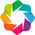

In [1]:
import matplotlib.pyplot as plt
import datetime
import holoviews as hv
import pandas as pd
import numpy as np
import warnings
import sqlite3
from math import pi
from holoviews.operation.timeseries import rolling, rolling_outlier_std
from holoviews.streams import Stream
from bokeh.plotting import figure, show
hv.notebook_extension('bokeh')

# Capturando dados:

### Iremos recolher dados a uma taxa de um dado a cada 5min de 24/01/2017 até o presente momento

In [2]:
today = datetime.datetime.now()
yearago = datetime.datetime(2017,1,24)

def fetch_ohlcv(symbol,start,end):
    print('Capturando OHLCV de {} de {} até {} em uma taxa de 5min.'.format(symbol, start, end))
    url = 'https://poloniex.com/public?command=returnChartData&currencyPair={}&start={}&end={}&period=300'.format(symbol,
                                                                        int(start.timestamp()),int(end.timestamp()))
    df = pd.read_json(url)
    df['date'] = pd.to_datetime(df.date)
    df.set_index(['date'], inplace=True)
    
    return df

### Criptomoedas escolhidas para estudo: USDT/Dash, USDT/Litecoin,USDT/Zcash.

In [3]:
dash = fetch_ohlcv('USDT_DASH',yearago,today)
ltc = fetch_ohlcv('USDT_LTC',yearago,today)
zec = fetch_ohlcv('USDT_ZEC',yearago,today)

Capturando OHLCV de USDT_DASH de 2017-01-24 00:00:00 até 2018-01-29 15:21:58.902418 em uma taxa de 5min.
Capturando OHLCV de USDT_LTC de 2017-01-24 00:00:00 até 2018-01-29 15:21:58.902418 em uma taxa de 5min.
Capturando OHLCV de USDT_ZEC de 2017-01-24 00:00:00 até 2018-01-29 15:21:58.902418 em uma taxa de 5min.


#### Aqui acrescentamos duas colunas em nossos data frames, que serão uteís para análise e visualização. São elas, o retorno a cada 5 minutos, e a média aritmética entre os preços de abertura,fechamento,alta e baixa

In [4]:
dash_mean = dash[['close','high','low','open']].mean(axis=1)
ltc_mean = ltc[['close','high','low','open']].mean(axis=1)
zec_mean = zec[['close','high','low','open']].mean(axis=1)

dash['mean'] = dash_mean.values
ltc['mean'] = ltc_mean.values
zec['mean'] = zec_mean.values

dash['5m_return'] = dash.close/dash.close.shift(1) - 1
ltc['5m_return'] = ltc.close/ltc.close.shift(1) - 1
zec['5m_return'] = zec.close/zec.close.shift(1) - 1

# Após a captura efetuada, criamos um banco de dados SQL

In [5]:
dados_sql = 'bernardob_summerproject.sqlite'
conn = sqlite3.connect(dados_sql)
cur = conn.cursor()

In [6]:
### Cria as tabelas no bd
def tabela_sql(dataframe, table_name):   
    dataframe.to_sql(table_name, conn)
        
tabela_sql(dash, 'DASH')
tabela_sql(ltc, 'LTC')
tabela_sql(zec, 'ZEC')

In [3]:
### Depois de criado o bd, podemos começar a partir daqui

dados_sql = 'bernardob_summerproject.sqlite'
conn = sqlite3.connect(dados_sql)
cur = conn.cursor()


### Verificamos as tabelas existentes no bd

cur.execute('SELECT name FROM sqlite_master WHERE type="table";')
tabelasbd = cur.fetchall() 
print('Tabelas no banco de dados: ', tabelasbd)

Tabelas no banco de dados:  [('DASH',), ('LTC',), ('ZEC',)]


In [4]:
### Carregamos os dados do banco criado

def carrega_tabela(table_name): 
    df = pd.read_sql_query('SELECT * FROM {} ORDER BY date ASC'.format(table_name), conn)
    df['date'] = pd.to_datetime(df['date'])
    df = df.set_index('date')
    return df

dash = carrega_tabela('DASH')
ltc = carrega_tabela('LTC')
zec = carrega_tabela('ZEC')

In [5]:
### Conferimos o início e o final das tabelas criadas:

dash.head()

,close,high,low,open,quoteVolume,volume,weightedAverage,mean,5m_return
date,,,,,,,,,
2017-01-24 02:00:00,14.740366,14.745765,14.669317,14.745765,0.520482,7.672765,14.741647,14.725304,NaN
2017-01-24 02:05:00,14.752649,14.752649,14.681027,14.752649,0.582906,8.597668,14.749668,14.734744,0.000833
2017-01-24 02:10:00,14.752649,14.752649,14.752649,14.752649,0.020730,0.305827,14.752649,14.752649,0.000000
2017-01-24 02:15:00,14.786798,14.786798,14.786798,14.786798,0.000064,0.000949,14.786798,14.786798,0.002315
2017-01-24 02:20:00,14.771939,14.788130,14.752649,14.788130,4.292287,63.323350,14.752822,14.775212,-0.001005


In [6]:
dash.tail()

,close,high,low,open,quoteVolume,volume,weightedAverage,mean,5m_return
date,,,,,,,,,
2018-01-29 17:00:00,770.018161,773.010248,770.018161,773.010248,9.980844,7685.442751,770.019342,771.514204,0.000007
2018-01-29 17:05:00,773.012481,773.012481,773.012481,773.012481,0.094198,72.816145,773.012481,773.012481,0.003889
2018-01-29 17:10:00,770.106227,777.762150,770.106227,777.762150,0.172941,134.462677,777.505616,773.934189,-0.003760
2018-01-29 17:15:00,770.106227,770.106227,770.106227,770.106227,0.000000,0.000000,770.106227,770.106227,0.000000
2018-01-29 17:20:00,777.762150,777.762150,777.762150,777.762150,0.081639,63.496113,777.762150,777.762150,0.009941


In [7]:
ltc.head()

,close,high,low,open,quoteVolume,volume,weightedAverage,mean,5m_return
date,,,,,,,,,
2017-01-24 02:00:00,3.779622,3.781757,3.761000,3.761000,38.460887,144.673483,3.761574,3.770845,NaN
2017-01-24 02:05:00,3.779214,3.779396,3.779214,3.779396,0.045854,0.173294,3.779305,3.779305,-0.000108
2017-01-24 02:10:00,3.778981,3.778981,3.778981,3.778981,0.068808,0.260025,3.778981,3.778981,-0.000061
2017-01-24 02:15:00,3.778603,3.778822,3.778603,3.778822,0.045868,0.173322,3.778713,3.778713,-0.000100
2017-01-24 02:20:00,3.776556,3.778603,3.761000,3.778603,89.735466,337.496562,3.761016,3.773691,-0.000542


In [8]:
ltc.tail()

,close,high,low,open,quoteVolume,volume,weightedAverage,mean,5m_return
date,,,,,,,,,
2018-01-29 16:55:00,183.999847,183.999847,183.999847,183.999847,14.056219,2586.342236,183.999847,183.999847,2.010871e-09
2018-01-29 17:00:00,185.099999,185.100000,183.999847,183.999847,11.436749,2111.491746,184.623431,184.549924,5.979092e-03
2018-01-29 17:05:00,185.099997,185.099999,183.455402,184.393576,30.749594,5690.500937,185.059387,184.512244,-1.204754e-08
2018-01-29 17:10:00,183.455405,185.099751,183.455405,185.099751,4.499139,826.204735,183.636204,184.277578,-8.884884e-03
2018-01-29 17:15:00,185.097225,185.097225,183.455405,183.455406,3.121305,577.158990,184.909490,184.276315,8.949421e-03


In [9]:
zec.head()

,close,high,low,open,quoteVolume,volume,weightedAverage,mean,5m_return
date,,,,,,,,,
2017-01-24 02:00:00,42.2360,42.2360,42.2360,42.2360,0.044624,1.884747,42.236000,42.23600,NaN
2017-01-24 02:05:00,42.1601,42.2360,42.1601,42.2360,0.988760,41.698011,42.172027,42.19805,-0.001797
2017-01-24 02:10:00,42.1601,42.1601,42.1601,42.1601,0.000000,0.000000,42.160100,42.16010,0.000000
2017-01-24 02:15:00,42.1601,42.1601,42.1601,42.1601,0.000000,0.000000,42.160100,42.16010,0.000000
2017-01-24 02:20:00,42.1601,42.1601,42.1601,42.1601,16.019172,675.369881,42.160100,42.16010,0.000000


In [10]:
zec.tail()

,close,high,low,open,quoteVolume,volume,weightedAverage,mean,5m_return
date,,,,,,,,,
2018-01-29 16:55:00,452.999160,452.999160,452.999160,452.999160,1.000000,452.999160,452.999160,452.999160,0.002226
2018-01-29 17:00:00,456.989997,456.989997,453.000010,453.000010,0.554988,253.330461,456.461027,454.995004,0.008810
2018-01-29 17:05:00,456.989997,456.989997,456.989997,456.989997,0.000000,0.000000,456.989997,456.989997,0.000000
2018-01-29 17:10:00,453.999997,453.999997,453.989998,453.989998,0.151129,68.612052,453.997322,453.994997,-0.006543
2018-01-29 17:15:00,455.999997,455.999997,453.989998,453.999997,1.082823,491.746028,454.133246,454.997497,0.004405


# Visualizações:

## Iniciamos as visualizações com um plot dinâmico para observar a progressão dos preços de fechamento no período estudado.

In [11]:
cryptocoin = ['DASH', 'LTC','ZEC',]
data = {'DASH': dash, 'LTC':ltc,'ZEC':zec}

def symbol_close_price(symbol, **kwargs):
        '''
        Show "close price" of selected cryptocoin (as usual) progression (from 01/24/2017 to right now)
        '''
    
        df = data[symbol]
        df['date'] = df.index
        return hv.Curve(df, ('date', 'Date'), ('close', 'Close price'))

one_year_close = hv.DynamicMap(symbol_close_price, kdims='Symbol').redim.values(Symbol=cryptocoin)

In [12]:
%%opts Curve [width=700,tools=['hover'],show_grid=True] {+framewise} (color='#5D8AA8')
one_year_close

:DynamicMap   [Symbol]

### Podemos observar Outliers com um plot simples utilizando o primeiro:

In [13]:
%%opts Curve [width=700,tools=['hover'],show_grid=True] {+framewise} (color='#5D8AA8')
%%opts Scatter [width=700,tools=['hover']] {+framewise} (color='#E32636')
outliers = rolling(one_year_close)*rolling_outlier_std(one_year_close)
outliers

:DynamicMap   [Symbol]

# Volatilidade
##### No último mês

In [14]:
def rolling_vol(w, symbol):
        '''
        Show Volatility of "close price" of selected cryptocoin of last 18000 data (roughly one month) 
        '''
    
        dt = data[symbol]
        S = dt['close'].rolling(w).std()
        dt['Volatility'] = S
        dt['date'] = dash.index

        return hv.Curve(dt.iloc[-18000:], ('date', 'Date'), ('Volatility','Rolling volatility'))

rvol = hv.DynamicMap(rolling_vol, kdims=['Wsize', 'Symbol']).redim.values(Symbol=cryptocoin).redim.range(Wsize=(10,102))

In [15]:
%%opts Curve [width=700,tools=['hover'],show_grid=True] {+framewise} (color='#006A4E')
rvol

:DynamicMap   [Wsize,Symbol]

# Retorno comparado

In [16]:
%%opts Scatter [width=700, height=500, show_grid=True] {+framewise}
%%opts Curve (color='red' line_width=1.5)

eq_dash_zec = hv.Curve((np.arange(-.1,.1,.01),np.arange(-.1,.1,.01)),'DASH', 'ZEC')
eq_dash_ltc = hv.Curve((np.arange(-.1,.1,.01),np.arange(-.1,.1,.01)),'DASH', 'LTC')
eq_ltc_zec = hv.Curve((np.arange(-.1,.1,.01),np.arange(-.1,.1,.01)),'LTC', 'ZEC')

ret_dash_zec = hv.Scatter((dash['5m_return'][-18000:],zec['5m_return'][-18000:]),kdims=['DASH'], vdims=['ZEC']).redim.range(DASH=(-.1,.1),ZEC=(-.1,.1)).hist(num_bins=150, dimension=['DASH','ZEC'])
ret_dash_ltc = hv.Scatter((dash['5m_return'][-18000:],ltc['5m_return'][-18000:]),kdims=['DASH'], vdims=['LTC']).redim.range(DASH=(-.1,.1),LTC=(-.1,.1)).hist(num_bins=150, dimension=['DASH','LTC'])
ret_ltc_zec = hv.Scatter((ltc['5m_return'][-18000:],zec['5m_return'][-18000:]),kdims=['LTC'], vdims=['ZEC']).redim.range(LTC=(-.1,.1),ZEC=(-.1,.1)).hist(num_bins=150, dimension=['LTC','ZEC'])

(eq_dash_zec*ret_dash_zec)

:AdjointLayout
   :Overlay
      .Curve.I   :Curve   [DASH]   (ZEC)
      .Scatter.I :Scatter   [DASH]   (ZEC)
   :Histogram   [ZEC]   (ZEC_frequency)
   :Histogram   [DASH]   (DASH_frequency)

In [17]:
%%opts Scatter [width=700, height=500, show_grid=True] {+framewise}
%%opts Curve (color='red' line_width=1.5)

(eq_dash_ltc*ret_dash_ltc)

:AdjointLayout
   :Overlay
      .Curve.I   :Curve   [DASH]   (LTC)
      .Scatter.I :Scatter   [DASH]   (LTC)
   :Histogram   [LTC]   (LTC_frequency)
   :Histogram   [DASH]   (DASH_frequency)

In [18]:
%%opts Scatter [width=700, height=500, show_grid=True] {+framewise}
%%opts Curve (color='red' line_width=1.5)

(eq_ltc_zec*ret_ltc_zec)

:AdjointLayout
   :Overlay
      .Curve.I   :Curve   [LTC]   (ZEC)
      .Scatter.I :Scatter   [LTC]   (ZEC)
   :Histogram   [ZEC]   (ZEC_frequency)
   :Histogram   [LTC]   (LTC_frequency)

In [19]:
### Comparamos agora a media aritmetica do OHLC com com sua media ponderada, disponibilizada pela API

def mean_weav(symbol, **kwargs):
    df = data[symbol]
    df['date'] = df.index
    return hv.Curve(df[-18000:], ('date', 'Date'),('weightedAverage', 'Weighted Average'), label='W A of OHLCV')*\
                                hv.Curve(df[-18000:], ('date', 'Date'),('mean', 'Mean'), label='Mean of OHLC')

wame = hv.DynamicMap(mean_weav, kdims='Symbol').redim.values(Symbol=cryptocoin)

In [20]:
%%opts Curve [width=700, show_grid=True, tools=['hover']] {+framewise}
plot_opts = dict( legend_position='top_left')
(wame).opts(plot=plot_opts)

:DynamicMap   [Symbol]

In [21]:
### Comparamos os valores de Alta e Baixa, no último mês


def high_low(symbol, **kwargs):
    df = data[symbol]
    df['date'] = df.index
    return hv.Curve(df[-18000:], ('date', 'Date'),('high', 'High'), label='High')*\
                                hv.Curve(df[-18000:], ('date', 'Date'),('low', 'Low'), label='Low')
    
hilo = hv.DynamicMap(high_low, kdims='Symbol').redim.values(Symbol=cryptocoin)

In [22]:
%%opts Curve [width=700, show_grid=True, tools=['hover']] {+framewise}
plot_opts = dict( legend_position='top_left')
(hilo).opts(plot=plot_opts)

:DynamicMap   [Symbol]

# Candlestick Chart

### Mostra OHLC das últimas 60 observações (Últimas 5h de informações)

In [25]:
from math import pi

In [23]:
last_data = 60
w = 400000
TOOLS = "pan,wheel_zoom,hover,box_zoom,reset,save"

In [35]:
dash['date'] = dash.index

inc = dash.iloc[-last_data:].close > dash.iloc[-last_data:].open
dec = dash.iloc[-last_data:].open > dash.iloc[-last_data:].close

p = figure(x_axis_type="datetime", tools=TOOLS, plot_width=900, title = "DASH OHLC Candlestick")
p.xaxis.major_label_orientation = pi/4
p.grid.grid_line_alpha=0.3

p.segment(dash.iloc[-last_data:].date, dash.iloc[-last_data:].high, dash.iloc[-last_data:].date, dash.iloc[-last_data:].low, color="black")
p.vbar(dash.iloc[-last_data:].date[inc], w, dash.iloc[-last_data:].open[inc], dash.iloc[-last_data:].close[inc], fill_color="#D5E1DD", line_color="black")
p.vbar(dash.iloc[-last_data:].date[dec], w, dash.iloc[-last_data:].open[dec], dash.iloc[-last_data:].close[dec], fill_color="#F2583E", line_color="black")

show(p) 

In [33]:
ltc['date'] = ltc.index

inc2 = ltc.iloc[-last_data:].close > ltc.iloc[-last_data:].open
dec2 = ltc.iloc[-last_data:].open > ltc.iloc[-last_data:].close

q = figure(x_axis_type="datetime", tools=TOOLS, plot_width=900, title = "LTC OHLC Candlestick")
q.xaxis.major_label_orientation = pi/4
q.grid.grid_line_alpha=0.3

q.segment(ltc.iloc[-last_data:].date, ltc.iloc[-last_data:].high, ltc.iloc[-last_data:].date, ltc.iloc[-last_data:].low, color="black")
q.vbar(ltc.iloc[-last_data:].date[inc2], w, ltc.iloc[-last_data:].open[inc2], ltc.iloc[-last_data:].close[inc2], fill_color="#D5E1DD", line_color="black")
q.vbar(ltc.iloc[-last_data:].date[dec2], w, ltc.iloc[-last_data:].open[dec2], ltc.iloc[-last_data:].close[dec2], fill_color="#F2583E", line_color="black")

show(q)

In [37]:
zec['date'] = zec.index

inc3 = zec.iloc[-last_data:].close > zec.iloc[-last_data:].open
dec3 = zec.iloc[-last_data:].open > zec.iloc[-last_data:].close

r = figure(x_axis_type="datetime", tools=TOOLS, plot_width=900, title = "ZEC OHLC Candlestick")
r.xaxis.major_label_orientation = pi/4
r.grid.grid_line_alpha=0.3

r.segment(zec.iloc[-last_data:].date, zec.iloc[-last_data:].high, zec.iloc[-last_data:].date, zec.iloc[-last_data:].low, color="black")
r.vbar(zec.iloc[-last_data:].date[inc3], w, zec.iloc[-last_data:].open[inc3], zec.iloc[-last_data:].close[inc3], fill_color="#D5E1DD", line_color="black")
r.vbar(zec.iloc[-last_data:].date[dec3], w, zec.iloc[-last_data:].open[dec3], zec.iloc[-last_data:].close[dec3], fill_color="#F2583E", line_color="black")

show(r)